In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings("ignore")
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from scipy.stats import skew

In [2]:
df = pd.read_csv('/content/train.csv')
df.head()

,player_id,name,age,gender,country,height,weight,ball_controlling_skills,body_reflexes,body_balance,...,strong_foot,behaviour_rating,matches_played,fitness_rating,trophies_won,dedication_level,coaching,years_of_experience,no_of_disqualifications,selection
0,PLID_4964,Keva Horan,23,M,Ukraine,6'2,176lbs,77.0,58.0,47.0,...,Right,7.7,NaN,8.1,2.0,High,Talent Hunt,8.0,0.0,1
1,PLID_11234,Herma Tann,18,M,Russia,5'10,148lbs,54.0,69.0,70.0,...,Any,5.3,0.0,NaN,3.0,Medium,Source,3.0,0.0,0
2,PLID_19127,Eilene Kizer,16,F,Spain,6'2,172lbs,34.0,43.0,45.0,...,Left,4.7,0.0,6.6,5.0,Low,Academy,2.0,0.0,1
3,PLID_17467,Andrea Badgett,27,M,Chile,5'11,165lbs,79.0,73.0,76.0,...,Right,8.6,113.0,8.6,6.0,Medium,Academy,13.0,16.0,1
4,PLID_9661,Jeremiah Bumbalough,19,F,Argentina,5'8,158lbs,47.0,61.0,74.0,...,Right,NaN,0.0,5.7,5.0,Medium,Academy,4.0,0.0,0


In [3]:
# Check the columns in the dataset
df.columns

Index(['player_id', 'name', 'age', 'gender', 'country', 'height', 'weight',
       'ball_controlling_skills', 'body_reflexes', 'body_balance',
       'jumping_skills', 'penalties_conversion_rate', 'mental_strength',
       'goalkeeping_skills', 'defending_skills', 'passing_skills',
       'dribbling_skills', 'shot_accuracy', 'body_strength_stamina',
       'max_running_speed', 'strong_foot', 'behaviour_rating',
       'matches_played', 'fitness_rating', 'trophies_won', 'dedication_level',
       'coaching', 'years_of_experience', 'no_of_disqualifications',
       'selection'],
      dtype='object')

In [4]:
#Checking the number of rows and columns in the dataset
print('Shape of the Data: ', (df.shape))

Shape of the Data:  (13994, 30)


In [5]:
#Checking the basic information of dataset like count, datatypes of columns (categorical or numerical)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13994 entries, 0 to 13993
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   player_id                  13994 non-null  object 
 1   name                       13994 non-null  object 
 2   age                        13994 non-null  int64  
 3   gender                     13975 non-null  object 
 4   country                    13994 non-null  object 
 5   height                     13994 non-null  object 
 6   weight                     13577 non-null  object 
 7   ball_controlling_skills    13581 non-null  float64
 8   body_reflexes              13994 non-null  float64
 9   body_balance               13994 non-null  float64
 10  jumping_skills             13970 non-null  float64
 11  penalties_conversion_rate  13964 non-null  float64
 12  mental_strength            13966 non-null  float64
 13  goalkeeping_skills         13994 non-null  flo

In [6]:
#Checking for duplicates

display("Total number of of Duplicates present in data: %s" %df.duplicated().sum())

'Total number of of Duplicates present in data: 0'

In [7]:
#Checking how many rows are there in the dataset after removing the duplicates
print('Shape of the Data after duplicates removal: ', (df.shape))

Shape of the Data after duplicates removal:  (13994, 30)


In [8]:
df=df.reset_index(drop=True)
df

,player_id,name,age,gender,country,height,weight,ball_controlling_skills,body_reflexes,body_balance,...,strong_foot,behaviour_rating,matches_played,fitness_rating,trophies_won,dedication_level,coaching,years_of_experience,no_of_disqualifications,selection
0,PLID_4964,Keva Horan,23,M,Ukraine,6'2,176lbs,77.0,58.0,47.0,...,Right,7.7,NaN,8.1,2.0,High,Talent Hunt,8.0,0.0,1
1,PLID_11234,Herma Tann,18,M,Russia,5'10,148lbs,54.0,69.0,70.0,...,Any,5.3,0.0,NaN,3.0,Medium,Source,3.0,0.0,0
2,PLID_19127,Eilene Kizer,16,F,Spain,6'2,172lbs,34.0,43.0,45.0,...,Left,4.7,0.0,6.6,5.0,Low,Academy,2.0,0.0,1
3,PLID_17467,Andrea Badgett,27,M,Chile,5'11,165lbs,79.0,73.0,76.0,...,Right,8.6,113.0,8.6,6.0,Medium,Academy,13.0,16.0,1
4,PLID_9661,Jeremiah Bumbalough,19,F,Argentina,5'8,158lbs,47.0,61.0,74.0,...,Right,NaN,0.0,5.7,5.0,Medium,Academy,4.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13989,PLID_10956,Viva Stepney,20,M,Uruguay,6'0,161lbs,60.0,48.0,62.0,...,Right,6.0,NaN,7.6,2.0,Medium,Academy,6.0,0.0,1
13990,PLID_17290,Illa Pitre,18,F,England,5'10,165lbs,53.0,68.0,59.0,...,Right,5.3,0.0,5.6,3.0,Medium,Academy,4.0,0.0,0
13991,PLID_5193,Marylouise Mosley,17,M,Japan,6'0,172lbs,56.0,73.0,62.0,...,Left,5.7,0.0,7.7,3.0,Low,Talent Hunt,2.0,0.0,1
13992,PLID_12173,Teri Escamilla,20,F,Ukraine,5'10,150lbs,71.0,69.0,70.0,...,Left,6.8,1.0,5.8,4.0,Medium,Academy,6.0,0.0,1


#checking missing values

Number of Missing Values in our data set



,Variable,Missing Values
0,player_id,0
1,name,0
2,age,0
3,gender,19
4,country,0
5,height,0
6,weight,417
7,ball_controlling_skills,413
8,body_reflexes,0
9,body_balance,0



 Percentage of Missing Values in our data set


,Count
player_id,0.000000
name,0.000000
age,0.000000
gender,0.135772
country,0.000000
height,0.000000
weight,2.979849
ball_controlling_skills,2.951265
body_reflexes,0.000000
body_balance,0.000000


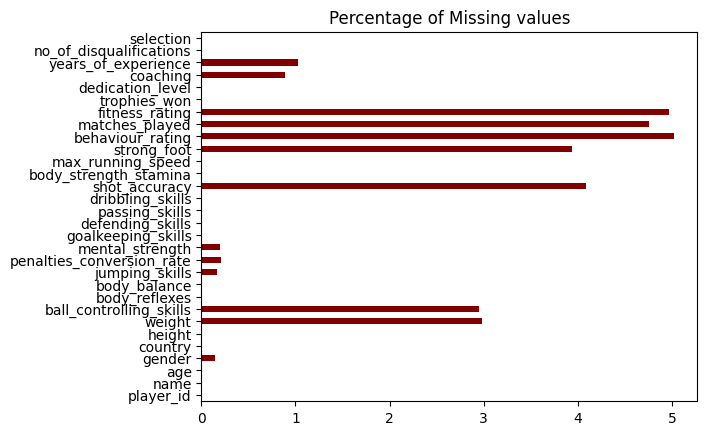

In [9]:
print("Number of Missing Values in our data set\n")
missing_df = df.isnull().sum().to_frame().reset_index().rename({"index" : 'Variable', 0: 'Missing Values'}, axis =1)
display(missing_df.style.background_gradient('gnuplot2_r'))
print("\n Percentage of Missing Values in our data set")
display((df.isnull().sum() / (len(df.index)) * 100).head(20).to_frame().rename({0:'Count'}, axis = 1).style.background_gradient('gnuplot2_r'))
round((df.isnull().sum() / (len(df.index)) * 100) , 2).plot(kind = 'barh',color ='maroon')

plt.title("Percentage of Missing values");

In [11]:
#Checking Statistics Summary of numerical columns
df.describe()

,age,ball_controlling_skills,body_reflexes,body_balance,jumping_skills,penalties_conversion_rate,mental_strength,goalkeeping_skills,defending_skills,passing_skills,...,shot_accuracy,body_strength_stamina,max_running_speed,behaviour_rating,matches_played,fitness_rating,trophies_won,years_of_experience,no_of_disqualifications,selection
count,13994.000000,13581.000000,13994.000000,13994.000000,13994.000000,13994.000000,13994.000000,13994.000000,13994.000000,13994.000000,...,13422.000000,13994.000000,13994.000000,13291.000000,13328.000000,13299.000000,13994.000000,13850.000000,13994.000000,13994.000000
mean,21.135844,56.043958,61.934329,62.753323,63.624696,48.495703,56.768366,16.474632,48.108118,52.935973,...,47.178140,62.652780,23.586094,5.822068,3.908463,6.405482,3.389095,6.434152,-4.740675,0.557525
std,5.162719,16.787353,14.931963,14.203638,11.932386,15.750595,11.965754,16.874551,16.821929,14.201782,...,15.803991,11.512526,5.194387,1.095702,13.583229,1.706983,1.709152,4.450954,72.023656,0.496698
min,16.000000,5.000000,12.000000,9.000000,14.000000,7.000000,9.000000,1.000000,9.000000,13.000000,...,7.000000,15.000000,5.400000,2.100000,0.000000,1.000000,0.000000,1.000000,-999.000000,0.000000
25%,17.000000,51.000000,54.000000,55.000000,57.000000,39.000000,49.000000,10.000000,36.000000,45.000000,...,38.000000,56.000000,21.100000,5.100000,0.000000,5.600000,2.000000,2.000000,0.000000,0.000000
50%,20.000000,61.000000,64.000000,65.000000,64.000000,49.000000,58.000000,11.000000,52.000000,56.000000,...,50.000000,64.000000,24.600000,5.900000,0.000000,6.800000,3.000000,6.000000,0.000000,1.000000
75%,24.000000,67.000000,72.000000,73.000000,72.000000,60.000000,65.000000,12.000000,61.000000,63.000000,...,59.000000,71.000000,27.100000,6.500000,1.000000,7.500000,5.000000,10.000000,0.000000,1.000000
max,61.000000,95.000000,96.000000,97.000000,95.000000,92.000000,92.000000,88.000000,86.000000,89.000000,...,86.000000,92.000000,35.000000,9.800000,151.000000,10.000000,9.000000,26.000000,25.000000,1.000000


In [12]:
#Checking Summary of categorical columns
df.describe(include="object")

,player_id,name,gender,country,height,weight,strong_foot,dedication_level,coaching
count,13994,13994,13994,13994,13994,13577,13442,13994,13869
unique,13994,13994,2,163,31,88,4,3,4
top,PLID_4964,Keva Horan,M,England,6'0,165lbs,Right,Medium,Academy
freq,1,1,7011,1157,2251,1106,8359,9704,9390


In [13]:
#cleaning string in column names

In [14]:
df.columns = df.columns.str.lower().str.replace(" ", "_")
df.head()

,player_id,name,age,gender,country,height,weight,ball_controlling_skills,body_reflexes,body_balance,...,strong_foot,behaviour_rating,matches_played,fitness_rating,trophies_won,dedication_level,coaching,years_of_experience,no_of_disqualifications,selection
0,PLID_4964,Keva Horan,23,M,Ukraine,6'2,176lbs,77.0,58.0,47.0,...,Right,7.7,NaN,8.1,2.0,High,Talent Hunt,8.0,0.0,1
1,PLID_11234,Herma Tann,18,M,Russia,5'10,148lbs,54.0,69.0,70.0,...,Any,5.3,0.0,NaN,3.0,Medium,Source,3.0,0.0,0
2,PLID_19127,Eilene Kizer,16,F,Spain,6'2,172lbs,34.0,43.0,45.0,...,Left,4.7,0.0,6.6,5.0,Low,Academy,2.0,0.0,1
3,PLID_17467,Andrea Badgett,27,M,Chile,5'11,165lbs,79.0,73.0,76.0,...,Right,8.6,113.0,8.6,6.0,Medium,Academy,13.0,16.0,1
4,PLID_9661,Jeremiah Bumbalough,19,F,Argentina,5'8,158lbs,47.0,61.0,74.0,...,Right,NaN,0.0,5.7,5.0,Medium,Academy,4.0,0.0,0


Handling categorical data

In [15]:
# If the data is Categorical, check with reference to domain whether the following parameters are valid or not:
#      1. Check the unique values.
#      2. Check if there are Spelling errors or not.
#      3. Check if any unusual category exists, if yes then remove it.

In [16]:
#Making List of Categorical Columns

categorical = list(df.dtypes[df.dtypes == 'object'].index)
categorical
# Other methods
# list(df.select_dtypes(include = 'O').columns)
# [col for col in df.columns if df[col].dtype == 'object']

['player_id',
 'name',
 'gender',
 'country',
 'height',
 'weight',
 'strong_foot',
 'dedication_level',
 'coaching']

In [17]:
#Cleaning Categorical Data in our data set

for col in categorical:
    df[col] = df[col].str.lower().str.replace(" ", "_")

df.head()

,player_id,name,age,gender,country,height,weight,ball_controlling_skills,body_reflexes,body_balance,...,strong_foot,behaviour_rating,matches_played,fitness_rating,trophies_won,dedication_level,coaching,years_of_experience,no_of_disqualifications,selection
0,plid_4964,keva_horan,23,m,ukraine,6'2,176lbs,77.0,58.0,47.0,...,right,7.7,NaN,8.1,2.0,high,talent_hunt,8.0,0.0,1
1,plid_11234,herma_tann,18,m,russia,5'10,148lbs,54.0,69.0,70.0,...,any,5.3,0.0,NaN,3.0,medium,source,3.0,0.0,0
2,plid_19127,eilene_kizer,16,f,spain,6'2,172lbs,34.0,43.0,45.0,...,left,4.7,0.0,6.6,5.0,low,academy,2.0,0.0,1
3,plid_17467,andrea_badgett,27,m,chile,5'11,165lbs,79.0,73.0,76.0,...,right,8.6,113.0,8.6,6.0,medium,academy,13.0,16.0,1
4,plid_9661,jeremiah_bumbalough,19,f,argentina,5'8,158lbs,47.0,61.0,74.0,...,right,NaN,0.0,5.7,5.0,medium,academy,4.0,0.0,0


In [18]:
#Checkin the unique values in categorical columns
for col in categorical:
    print(col)
    print(df[col].unique())
    print("Number of unique classes ",df[col].nunique())
    print('\n')

player_id
['plid_4964' 'plid_11234' 'plid_19127' ... 'plid_5193' 'plid_12173'
 'plid_236']
Number of unique classes  13994


name
['keva_horan' 'herma_tann' 'eilene_kizer' ... 'marylouise_mosley'
 'teri_escamilla' 'darius_schuman']
Number of unique classes  13994


gender
['m' 'f']
Number of unique classes  2


country
['ukraine' 'russia' 'spain' 'chile' 'argentina' 'guinea' 'china_pr'
 'united_states' 'italy' 'belgium' 'germany' 'england' 'colombia' 'brazil'
 'france' 'netherlands' 'afghanistan' 'sweden' 'switzerland' 'ghana'
 'poland' 'iceland' 'bulgaria' 'mexico' 'northern_ireland' 'uruguay'
 'ivory_coast' 'portugal' 'new_zealand' 'norway' 'korea_republic'
 'scotland' 'greece' 'denmark' 'slovakia' 'japan' 'togo' 'slovenia'
 'finland' 'australia' 'paraguay' 'republic_of_ireland' 'croatia'
 'saudi_arabia' 'wales' 'czech_republic' 'austria' 'georgia' 'gabon'
 'turkey' 'madagascar' 'serbia' 'congo' 'tunisia' 'canada' 'senegal'
 'thailand' 'kosovo' 'israel' 'montserrat' 'guatemala' 'alge

Handling numerical data

In [19]:
# If the data is CONTINOUS, check with reference to domain whether the following parameters are valid or not:
#      1. Negative Numbers are allowed or not.
#      2. Positive Numbers are allowed or not.
#      3. Decimals are allowed or just Integers are Expected.
# If the data is DISCRETE, check with reference to domain whether the following parameters are valid or not:
#      1. Negative Numbers are allowed or not.
#      2. Positive Numbers are allowed or not.
#      3. Decimals are allowed or just Integers are Expected.
#      4. Check whether the number falls in the specified Range defined by DOMAIN


In [20]:
#Checking for negative values in Numerical Columns
numerical = [col for col in df.columns if col not in categorical]
for i in numerical:
    df[df[i]<0]
    print("Records with Negative values in %s : " %i,df[df[i]<0])
    print('\n')

Records with Negative values in age :  Empty DataFrame
Columns: [player_id, name, age, gender, country, height, weight, ball_controlling_skills, body_reflexes, body_balance, jumping_skills, penalties_conversion_rate, mental_strength, goalkeeping_skills, defending_skills, passing_skills, dribbling_skills, shot_accuracy, body_strength_stamina, max_running_speed, strong_foot, behaviour_rating, matches_played, fitness_rating, trophies_won, dedication_level, coaching, years_of_experience, no_of_disqualifications, selection]
Index: []

[0 rows x 30 columns]


Records with Negative values in ball_controlling_skills :  Empty DataFrame
Columns: [player_id, name, age, gender, country, height, weight, ball_controlling_skills, body_reflexes, body_balance, jumping_skills, penalties_conversion_rate, mental_strength, goalkeeping_skills, defending_skills, passing_skills, dribbling_skills, shot_accuracy, body_strength_stamina, max_running_speed, strong_foot, behaviour_rating, matches_played, fitness_ra

In [21]:
#Checking for 0 values
numerical = [col for col in df.columns if col not in categorical]
for i in numerical:
   df[df[i]==0]
   print("Records with 0 values in %s : " %i,df[df[i]==0])
   print('\n')
    #ax = sns.distplot(df[i], color = 'purple')
    #plt.title("Negative values in %s" %i, fontsize = 20)
    #plt.xlabel(" ")
    #plt.ylabel(" ")
    #plt.xticks(fontsize = 15)
    #plt.show();


Records with 0 values in age :  Empty DataFrame
Columns: [player_id, name, age, gender, country, height, weight, ball_controlling_skills, body_reflexes, body_balance, jumping_skills, penalties_conversion_rate, mental_strength, goalkeeping_skills, defending_skills, passing_skills, dribbling_skills, shot_accuracy, body_strength_stamina, max_running_speed, strong_foot, behaviour_rating, matches_played, fitness_rating, trophies_won, dedication_level, coaching, years_of_experience, no_of_disqualifications, selection]
Index: []

[0 rows x 30 columns]


Records with 0 values in ball_controlling_skills :  Empty DataFrame
Columns: [player_id, name, age, gender, country, height, weight, ball_controlling_skills, body_reflexes, body_balance, jumping_skills, penalties_conversion_rate, mental_strength, goalkeeping_skills, defending_skills, passing_skills, dribbling_skills, shot_accuracy, body_strength_stamina, max_running_speed, strong_foot, behaviour_rating, matches_played, fitness_rating, trophies

In [22]:
#Correlation Matrix of Data
df.corr().style.background_gradient("copper_r")

,age,ball_controlling_skills,body_reflexes,body_balance,jumping_skills,penalties_conversion_rate,mental_strength,goalkeeping_skills,defending_skills,passing_skills,dribbling_skills,shot_accuracy,body_strength_stamina,max_running_speed,behaviour_rating,matches_played,fitness_rating,trophies_won,years_of_experience,no_of_disqualifications,selection
age,1.000000,0.083226,-0.008863,-0.057670,0.143436,0.123487,0.314425,0.077189,0.156910,0.153986,0.021298,0.149276,0.201067,-0.131127,0.373710,0.211322,0.079287,0.031321,0.841174,-0.010648,-0.161858
ball_controlling_skills,0.083226,1.000000,0.702451,0.603590,0.204712,0.769052,0.697311,-0.788039,0.599675,0.896749,0.935523,0.896938,0.552414,0.685486,0.456825,0.213193,0.724426,0.271955,0.092147,-0.007704,0.266491
body_reflexes,-0.008863,0.702451,1.000000,0.760907,0.225847,0.563964,0.450051,-0.537320,0.296905,0.672426,0.764390,0.656593,0.275718,0.797895,0.283540,0.087777,0.571632,0.236306,-0.020540,-0.015511,0.162903
body_balance,-0.057670,0.603590,0.760907,1.000000,0.201114,0.486241,0.337324,-0.520488,0.289356,0.584480,0.664494,0.541877,0.129391,0.687482,0.159227,0.041408,0.482731,0.197795,-0.074671,-0.012731,0.100898
jumping_skills,0.143436,0.204712,0.225847,0.201114,1.000000,0.135886,0.263744,-0.204509,0.325767,0.157505,0.151591,0.186988,0.403435,0.244935,0.267282,0.112601,0.362816,0.056769,0.156013,-0.010910,0.085323
penalties_conversion_rate,0.123487,0.769052,0.563964,0.486241,0.135886,1.000000,0.567732,-0.631388,0.305487,0.690538,0.772745,0.872307,0.391506,0.542660,0.353427,0.212803,0.517986,0.247989,0.141969,-0.012323,0.177101
mental_strength,0.314425,0.697311,0.450051,0.337324,0.263744,0.567732,1.000000,-0.423189,0.520942,0.711444,0.620492,0.683997,0.528010,0.383829,0.663776,0.362436,0.543510,0.227326,0.367888,-0.002148,0.318692
goalkeeping_skills,0.077189,-0.788039,-0.537320,-0.520488,-0.204509,-0.631388,-0.423189,1.000000,-0.660254,-0.661463,-0.760564,-0.717514,-0.546024,-0.625644,-0.078789,-0.004823,-0.704367,-0.176665,0.098214,0.013678,-0.047467
defending_skills,0.156910,0.599675,0.296905,0.289356,0.325767,0.305487,0.520942,-0.660254,1.000000,0.636592,0.491838,0.464936,0.680394,0.335472,0.390215,0.157260,0.699844,0.100340,0.178304,0.001202,0.153933
passing_skills,0.153986,0.896749,0.672426,0.584480,0.157505,0.690538,0.711444,-0.661463,0.636592,1.000000,0.870070,0.849184,0.501256,0.595467,0.512608,0.254732,0.685628,0.265326,0.178630,-0.008077,0.257658


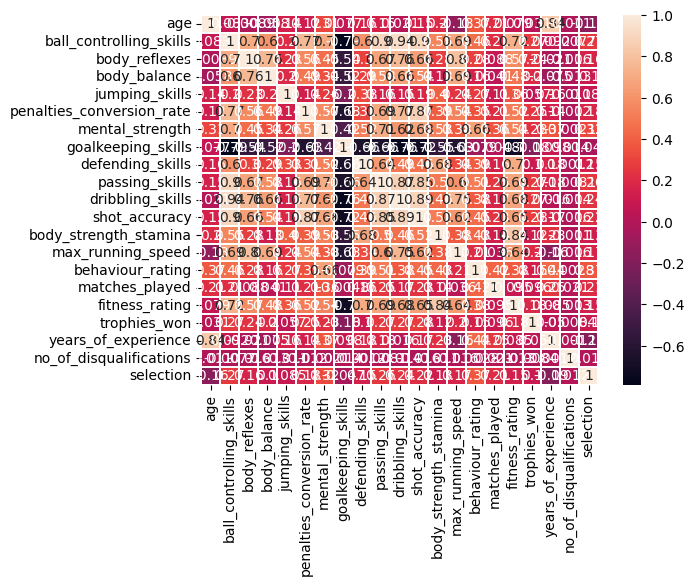

In [23]:
sns.heatmap(df.corr(),annot = True, lw = 0.1);

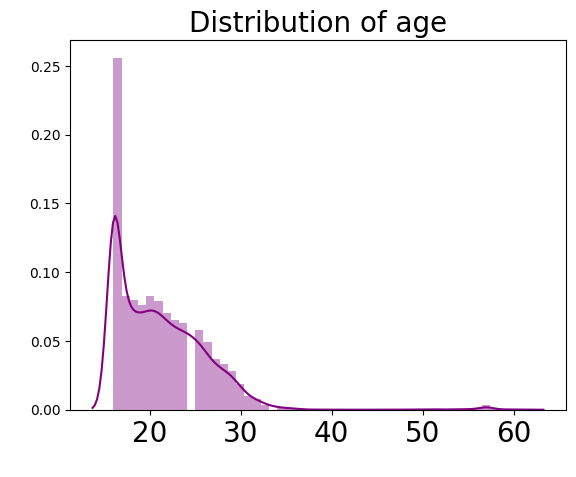

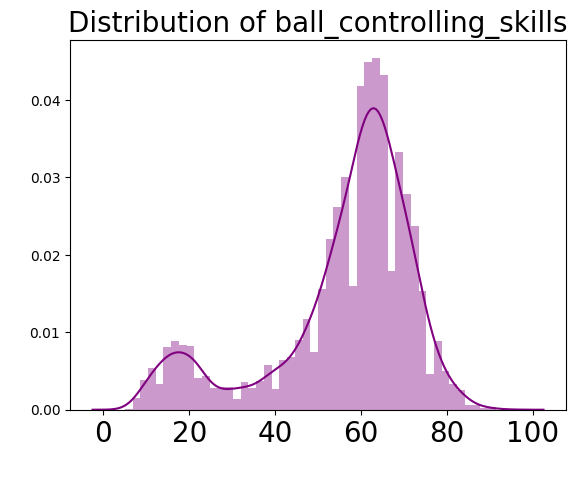

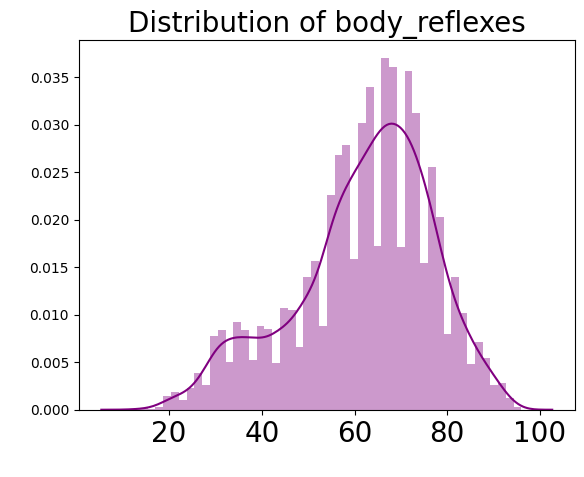

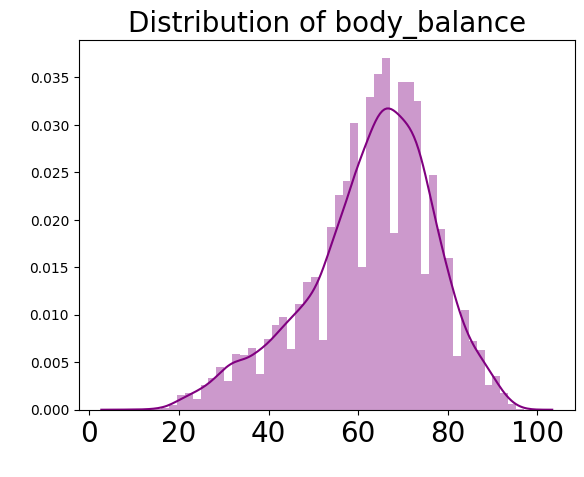

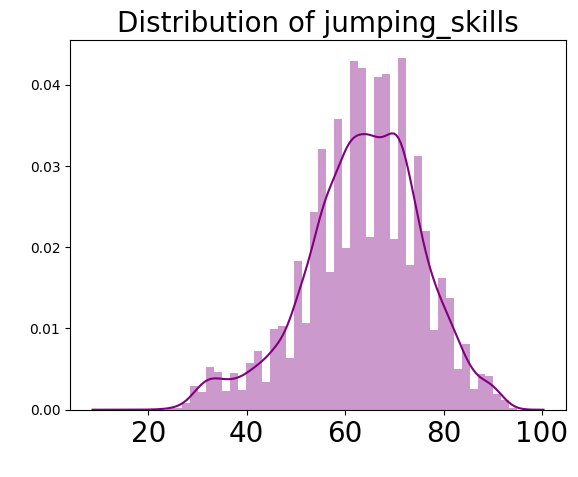

...

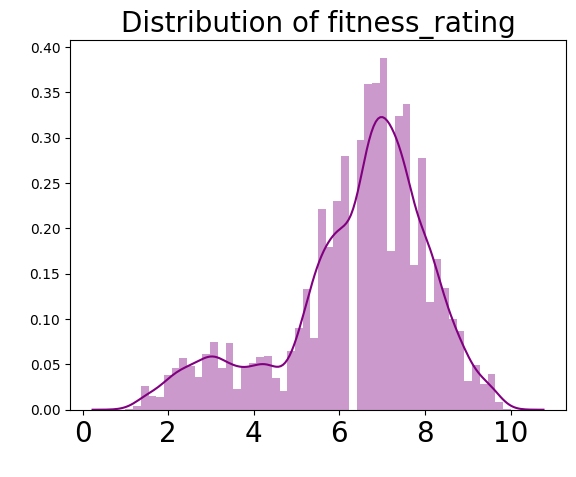

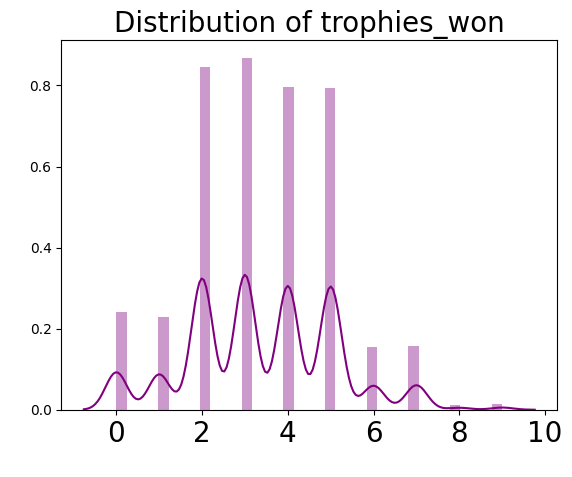

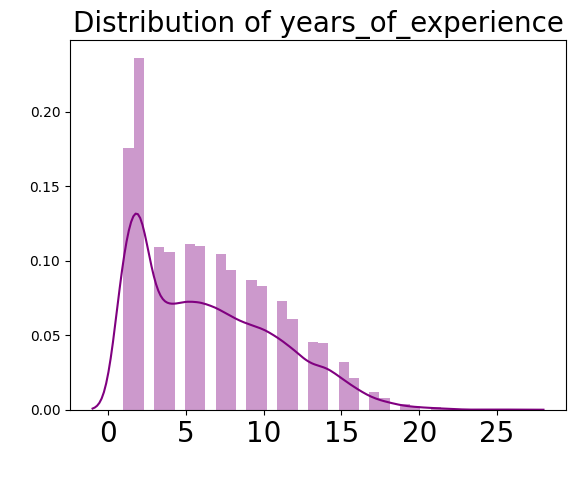

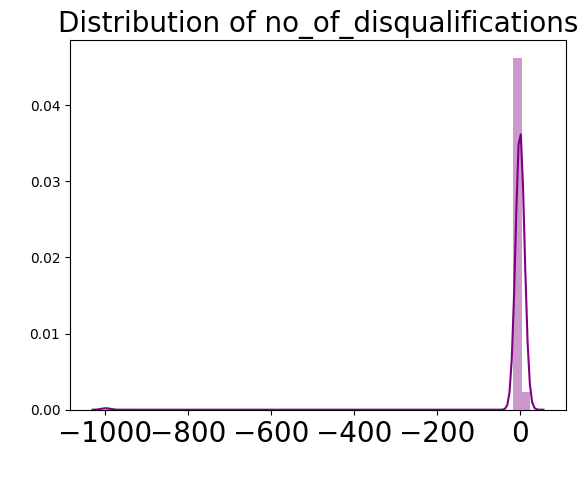

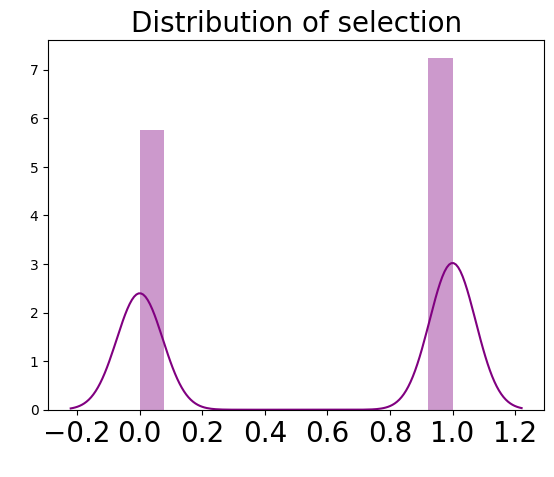

In [24]:
numerical = [col for col in df.columns if col not in categorical]
for i in numerical:

    ax = sns.distplot(df[i], color = 'purple')
    plt.title("Distribution of %s" %i, fontsize = 20)
    plt.xlabel(" ")
    plt.ylabel(" ")
    plt.xticks(fontsize = 20)
    plt.show();
    print('\n')


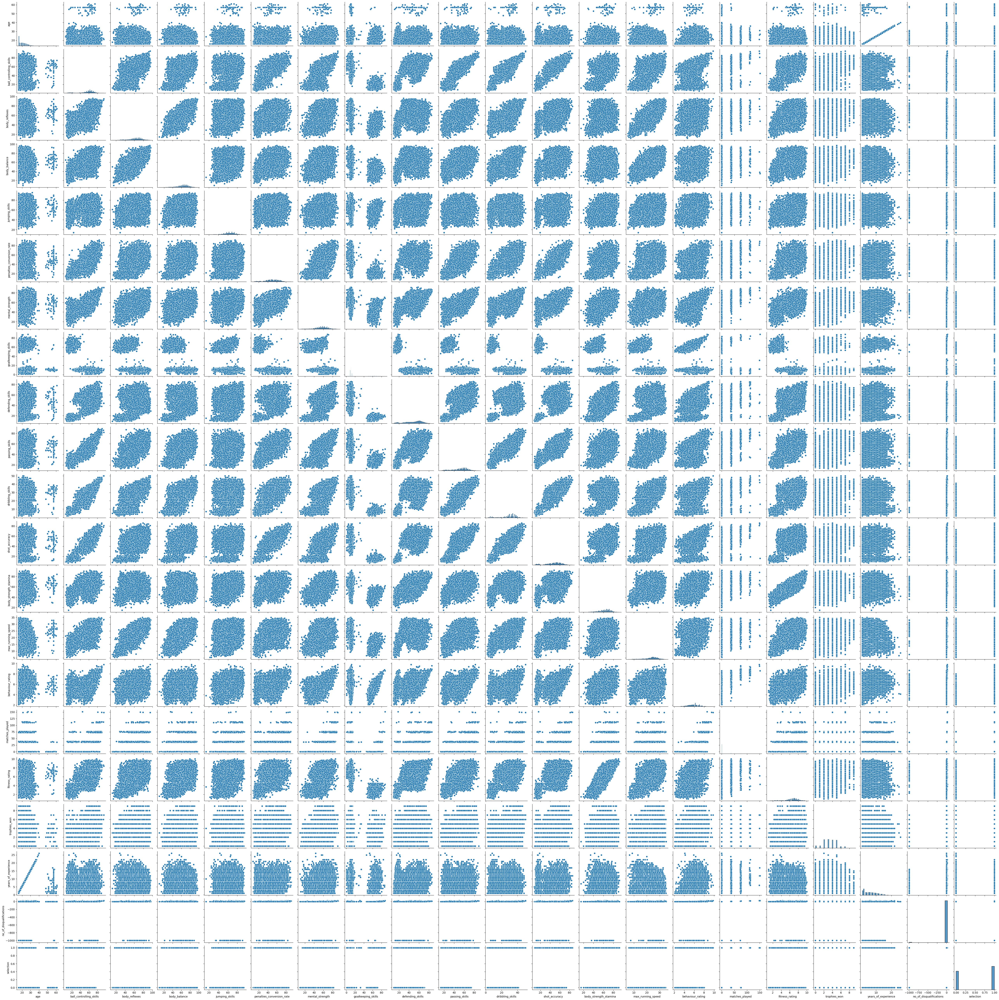

In [25]:
#Plotting a pairplot to check the relationship between the variables
sns.pairplot(df)

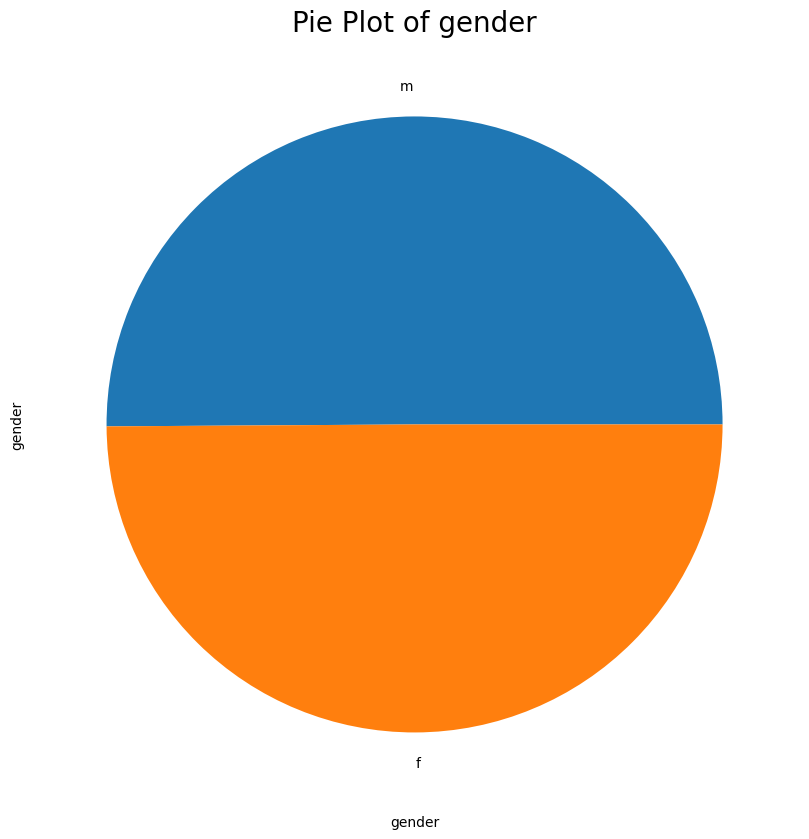

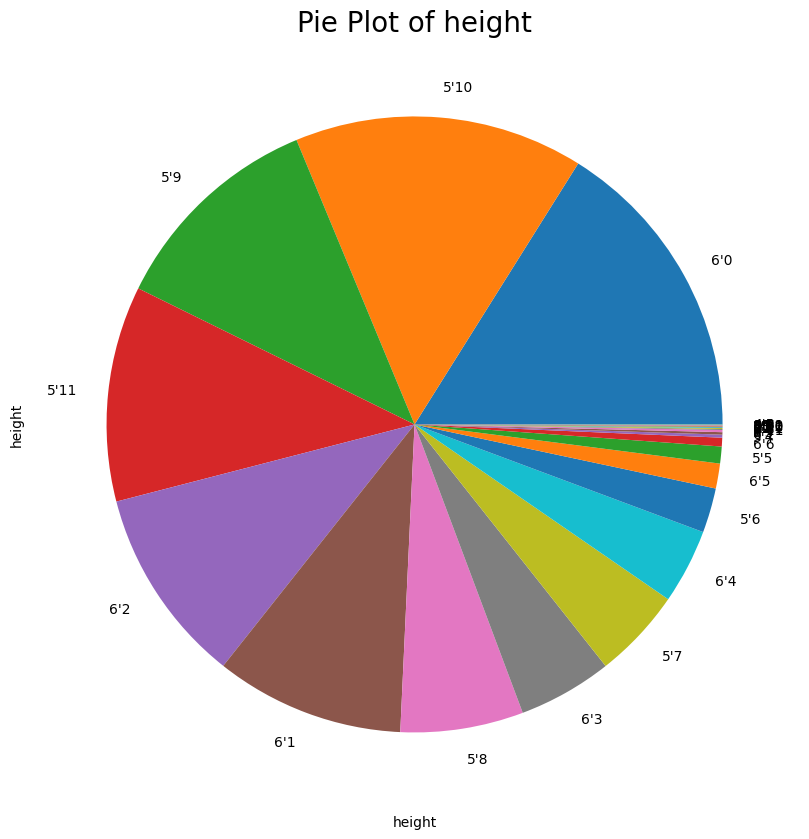

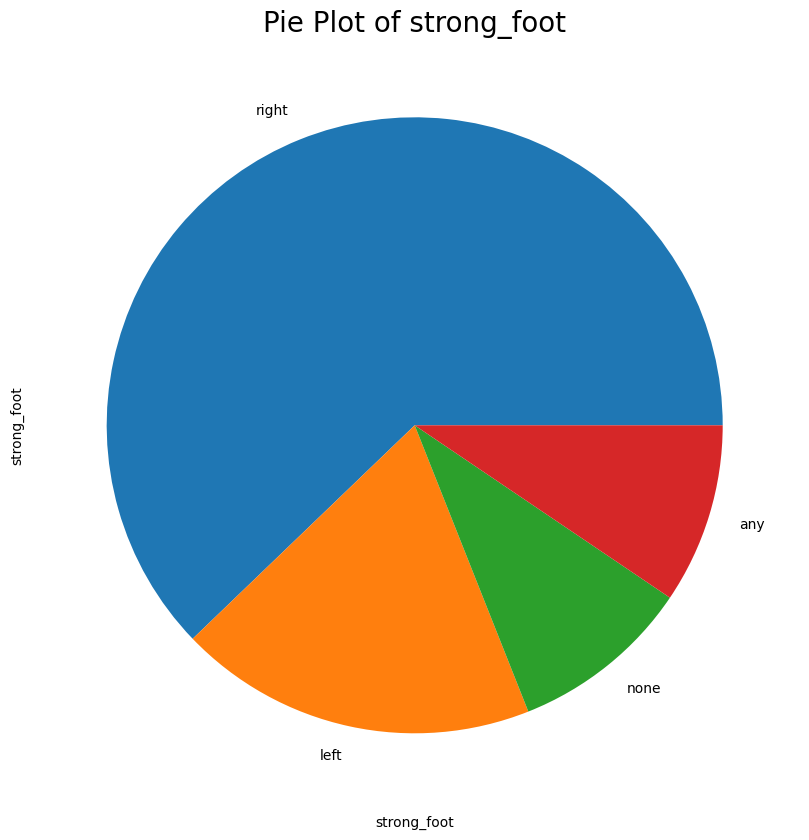

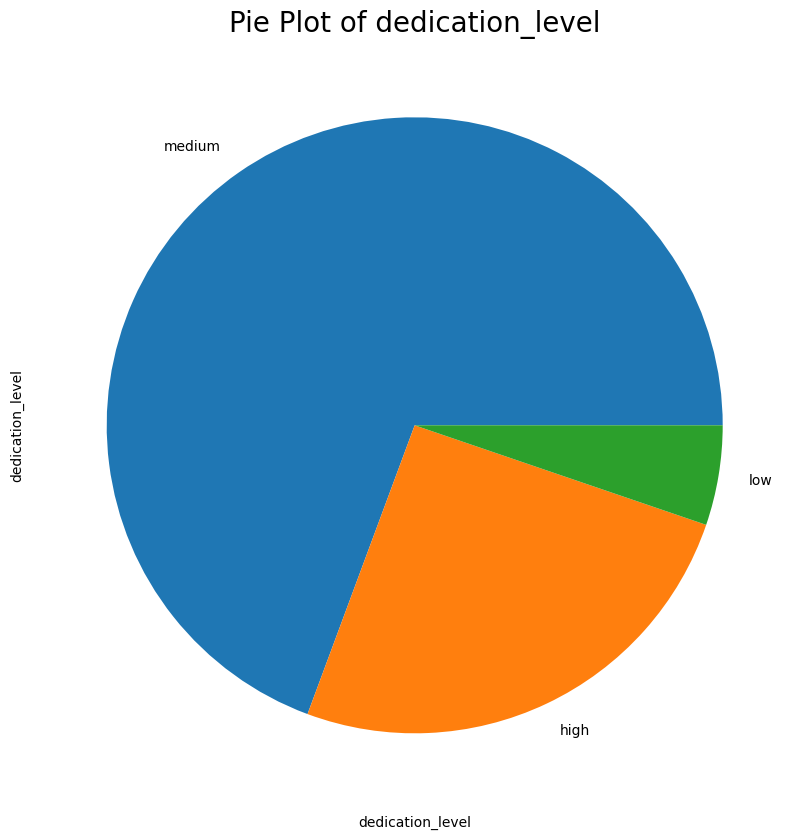

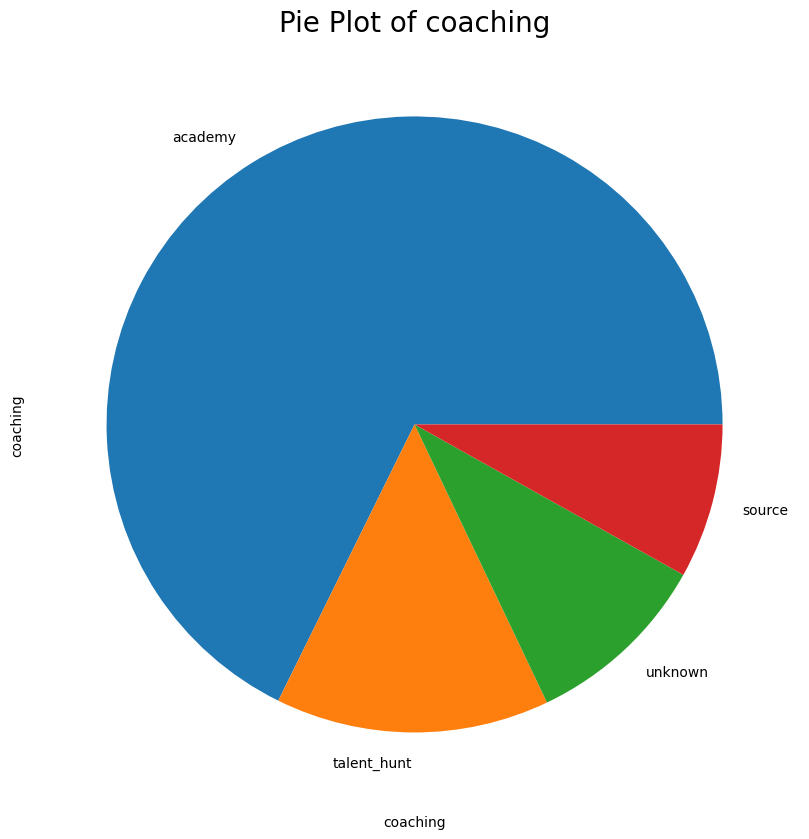

In [26]:
#Looping over categorical variables to check the Price over different Groups
for i in categorical:
    if df[i].nunique() < 70:
        f,ax=plt.subplots(figsize=(20,10))
        df[i].value_counts().plot(kind='pie')
        plt.title("Pie Plot of %s" %i, fontsize = 20)
        plt.xticks(fontsize = 12)
        plt.xlabel("%s"%i)
        #plt.ylabel("Car Price")
        plt.xticks(fontsize = 15, rotation = 90)
        plt.show();
        print('\n')


In [27]:
#Checking outliers in columns
df.head()

,player_id,name,age,gender,country,height,weight,ball_controlling_skills,body_reflexes,body_balance,...,strong_foot,behaviour_rating,matches_played,fitness_rating,trophies_won,dedication_level,coaching,years_of_experience,no_of_disqualifications,selection
0,plid_4964,keva_horan,23,m,ukraine,6'2,176lbs,77.0,58.0,47.0,...,right,7.7,NaN,8.1,2.0,high,talent_hunt,8.0,0.0,1
1,plid_11234,herma_tann,18,m,russia,5'10,148lbs,54.0,69.0,70.0,...,any,5.3,0.0,NaN,3.0,medium,source,3.0,0.0,0
2,plid_19127,eilene_kizer,16,f,spain,6'2,172lbs,34.0,43.0,45.0,...,left,4.7,0.0,6.6,5.0,low,academy,2.0,0.0,1
3,plid_17467,andrea_badgett,27,m,chile,5'11,165lbs,79.0,73.0,76.0,...,right,8.6,113.0,8.6,6.0,medium,academy,13.0,16.0,1
4,plid_9661,jeremiah_bumbalough,19,f,argentina,5'8,158lbs,47.0,61.0,74.0,...,right,NaN,0.0,5.7,5.0,medium,academy,4.0,0.0,0


In [29]:
#OUTLIER DETECTION in CROP
#Function to calc lowerRange and UpperRange using 1.5IQR rule
def outlierDetection(data1):
    #Sort in Ascending
    sorted(data1)
    #Q1 and Q3
    Q1,Q3 = np.nanpercentile(data1, [25,75])
    #Calc IQR
    IQR = Q3 - Q1
    #Calc lowerRange
    lowerRange = Q1 - (1.5 * IQR)
    #Calc upperRange
    upperRange = Q3 + (1.5 * IQR)
    #Return Ranges
    return lowerRange,upperRange

In [30]:
#outlier - zscore
z_scores = stats.zscore(df['ball_controlling_skills'])
threshold = 3
outlier_indices = np.where(z_scores > threshold)[0]
outlier_indices

array([], dtype=int64)

In [31]:
Q1 = df['jumping_skills'].quantile(0.25)
Q3 = df['jumping_skills'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

potential_outliers = df[(df['jumping_skills'] < lower_bound) | (df['jumping_skills'] > upper_bound)]

# Find the lower and upper bounds
lower_bound = Q1 - 1.5*IQR
upper_bound = Q3 + 1.5*IQR
print("Upper bound:", upper_bound)
print("Lower bound:", lower_bound)


Upper bound: 94.5
Lower bound: 34.5


In [32]:
Q1 = df['penalties_conversion_rate'].quantile(0.25)
Q3 = df['penalties_conversion_rate'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

potential_outliers = df[(df['penalties_conversion_rate'] < lower_bound) | (df['penalties_conversion_rate'] > upper_bound)]

# Find the lower and upper bounds
lower_bound = Q1 - 1.5*IQR
upper_bound = Q3 + 1.5*IQR
print("Upper bound:", upper_bound)
print("Lower bound:", lower_bound)


Upper bound: 91.5
Lower bound: 7.5


In [34]:
df.dtypes

player_id                     object
name                          object
age                            int64
gender                        object
country                       object
height                        object
weight                        object
ball_controlling_skills      float64
body_reflexes                float64
body_balance                 float64
jumping_skills               float64
penalties_conversion_rate    float64
mental_strength              float64
goalkeeping_skills           float64
defending_skills             float64
passing_skills               float64
dribbling_skills             float64
shot_accuracy                float64
body_strength_stamina        float64
max_running_speed            float64
strong_foot                   object
behaviour_rating             float64
matches_played               float64
fitness_rating               float64
trophies_won                 float64
dedication_level              object
coaching                      object
y

In [36]:
!pip install category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.8/81.8 kB 2.7 MB/s eta 0:00:00


In [38]:
#encoding - binary encoder

import category_encoders as ce

# Create an instance of the BinaryEncoder
gender_binary_encoder = ce.BinaryEncoder(cols=['gender'])

gender_binary = gender_binary_encoder.fit_transform(df['gender'])
df = pd.concat([df, gender_binary], axis=1)

In [39]:
gender_binary

,gender_0,gender_1
0,0,1
1,0,1
2,1,0
3,0,1
4,1,0
...,...,...
13989,0,1
13990,1,0
13991,0,1
13992,1,0


In [40]:
#encoding - binary encoder

import category_encoders as ce

# Create an instance of the BinaryEncoder
player_id_binary_encoder = ce.BinaryEncoder(cols=['player_id'])

player_id_binary = player_id_binary_encoder.fit_transform(df['player_id'])
df = pd.concat([df, player_id_binary], axis=1)

In [41]:
player_id_binary

,player_id_0,player_id_1,player_id_2,player_id_3,player_id_4,player_id_5,player_id_6,player_id_7,player_id_8,player_id_9,player_id_10,player_id_11,player_id_12,player_id_13
0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,1,1
3,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13989,1,1,0,1,1,0,1,0,1,0,0,1,1,0
13990,1,1,0,1,1,0,1,0,1,0,0,1,1,1
13991,1,1,0,1,1,0,1,0,1,0,1,0,0,0
13992,1,1,0,1,1,0,1,0,1,0,1,0,0,1


In [42]:
#encoding - binary encoder

import category_encoders as ce

# Create an instance of the BinaryEncoder
name_binary_encoder = ce.BinaryEncoder(cols=['name'])

name_binary = name_binary_encoder.fit_transform(df['name'])
df = pd.concat([df, name_binary], axis=1)

In [43]:
name_binary

,name_0,name_1,name_2,name_3,name_4,name_5,name_6,name_7,name_8,name_9,name_10,name_11,name_12,name_13
0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,1,1
3,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13989,1,1,0,1,1,0,1,0,1,0,0,1,1,0
13990,1,1,0,1,1,0,1,0,1,0,0,1,1,1
13991,1,1,0,1,1,0,1,0,1,0,1,0,0,0
13992,1,1,0,1,1,0,1,0,1,0,1,0,0,1


In [45]:
#encoding - binary encoder

import category_encoders as ce

# Create an instance of the BinaryEncoder
country_binary_encoder = ce.BinaryEncoder(cols=['country'])

country_binary = country_binary_encoder.fit_transform(df['country'])
df = pd.concat([df, country_binary], axis=1)

In [46]:
country_binary

,country_0,country_1,country_2,country_3,country_4,country_5,country_6,country_7
0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,1,1
3,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...
13989,0,0,0,1,1,0,1,0
13990,0,0,0,0,1,1,0,0
13991,0,0,1,0,0,1,0,0
13992,0,0,0,0,0,0,0,1


In [50]:
x = df.drop(['selection'], axis=1)
y = df['selection']